In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import classification_report, accuracy_score, mean_squared_error, r2_score
from sklearn.tree import DecisionTreeRegressor
import joblib

In [3]:
%matplotlib inline

In [4]:
df = pd.read_csv('desafio_indicium_imdb.csv')

### 1-Análise Exploratória

In [5]:
# Visualizar as primeiras linhas
df.head()

,Unnamed: 0,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross
0,1,The Godfather,1972,A,175 min,"Crime, Drama",9.2,An organized crime dynasty's aging patriarch t...,100.0,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1620367,"134,966,411"
1,2,The Dark Knight,2008,UA,152 min,"Action, Crime, Drama",9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,"534,858,444"
2,3,The Godfather: Part II,1974,A,202 min,"Crime, Drama",9.0,The early life and career of Vito Corleone in ...,90.0,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton,1129952,"57,300,000"
3,4,12 Angry Men,1957,U,96 min,"Crime, Drama",9.0,A jury holdout attempts to prevent a miscarria...,96.0,Sidney Lumet,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler,689845,"4,360,000"
4,5,The Lord of the Rings: The Return of the King,2003,U,201 min,"Action, Adventure, Drama",8.9,Gandalf and Aragorn lead the World of Men agai...,94.0,Peter Jackson,Elijah Wood,Viggo Mortensen,Ian McKellen,Orlando Bloom,1642758,"377,845,905"


In [6]:
# Remover colunas que começam com 'Unnamed'
df = df.loc[:, ~df.columns.str.startswith('Unnamed')]

In [7]:
# Remover caracteres não numéricos e converter para float
df['Gross'] = df['Gross'].str.replace(',', '').astype(float)

# Verificar se a conversão foi bem-sucedida
print(df['Gross'].head())


0    134966411.0
1    534858444.0
2     57300000.0
3      4360000.0
4    377845905.0
Name: Gross, dtype: float64


In [8]:
# Converter 'Released_Year' para numérico
df['Released_Year'] = pd.to_numeric(df['Released_Year'], errors='coerce').dropna().astype(int)

# Verificar se a conversão foi bem-sucedida
print(df['Released_Year'].head())


0    1972.0
1    2008.0
2    1974.0
3    1957.0
4    2003.0
Name: Released_Year, dtype: float64


In [9]:
# Verificar e remover linhas com valores ausentes nas colunas relevantes
df = df.dropna(subset=['Gross', 'IMDB_Rating', 'Meta_score', 'No_of_Votes'])

In [10]:
# Resumo estatístico
df.describe()

,Released_Year,IMDB_Rating,Meta_score,No_of_Votes,Gross
count,748.000000,749.000000,749.000000,7.490000e+02,7.490000e+02
mean,1995.072193,7.932977,77.456609,3.394611e+05,7.501430e+07
std,19.522071,0.284951,12.501970,3.434986e+05,1.133909e+08
min,1925.000000,7.600000,28.000000,2.519800e+04,1.305000e+03
25%,1985.750000,7.700000,70.000000,8.851100e+04,5.014000e+06
50%,2001.000000,7.900000,78.000000,2.194660e+05,3.200000e+07
75%,2010.000000,8.100000,86.000000,4.791200e+05,9.846786e+07
max,2019.000000,9.200000,100.000000,2.303232e+06,9.366622e+08


In [11]:
# Informações do DataFrame
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 749 entries, 0 to 996
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Series_Title   749 non-null    object 
 1   Released_Year  748 non-null    float64
 2   Certificate    713 non-null    object 
 3   Runtime        749 non-null    object 
 4   Genre          749 non-null    object 
 5   IMDB_Rating    749 non-null    float64
 6   Overview       749 non-null    object 
 7   Meta_score     749 non-null    float64
 8   Director       749 non-null    object 
 9   Star1          749 non-null    object 
 10  Star2          749 non-null    object 
 11  Star3          749 non-null    object 
 12  Star4          749 non-null    object 
 13  No_of_Votes    749 non-null    int64  
 14  Gross          749 non-null    float64
dtypes: float64(4), int64(1), object(10)
memory usage: 93.6+ KB


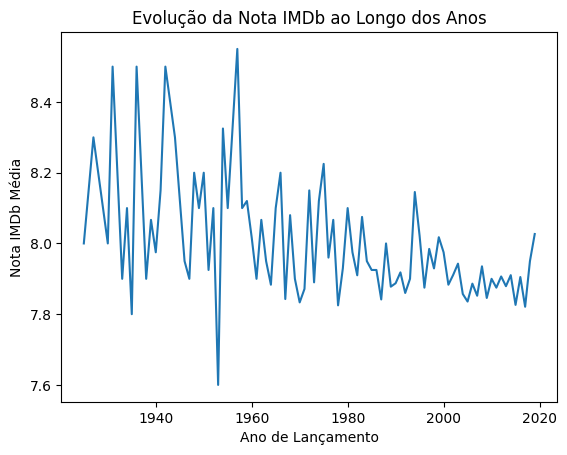

In [12]:
# Gráfico de linha para a evolução da nota IMDb ao longo dos anos
df.groupby('Released_Year')['IMDB_Rating'].mean().plot()
plt.title('Evolução da Nota IMDb ao Longo dos Anos')
plt.xlabel('Ano de Lançamento')
plt.ylabel('Nota IMDb Média')
plt.show()


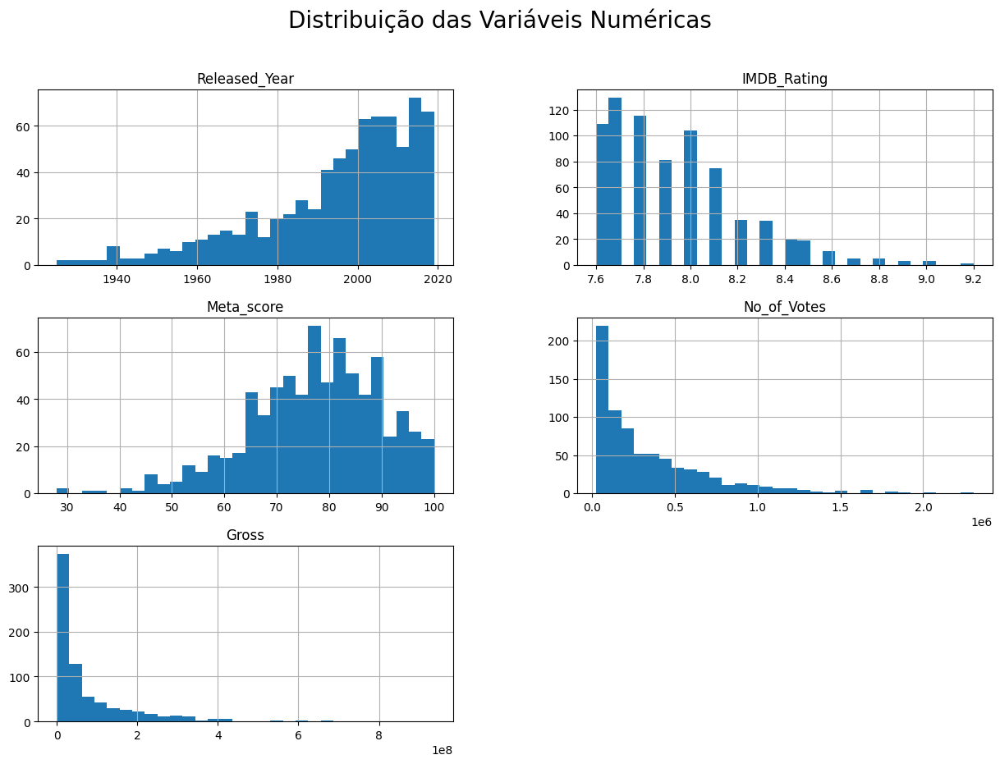

In [13]:
# Distribuição das variáveis numéricas
df.hist(bins=30, figsize=(15, 10))
plt.suptitle('Distribuição das Variáveis Numéricas', fontsize=20)
plt.show()


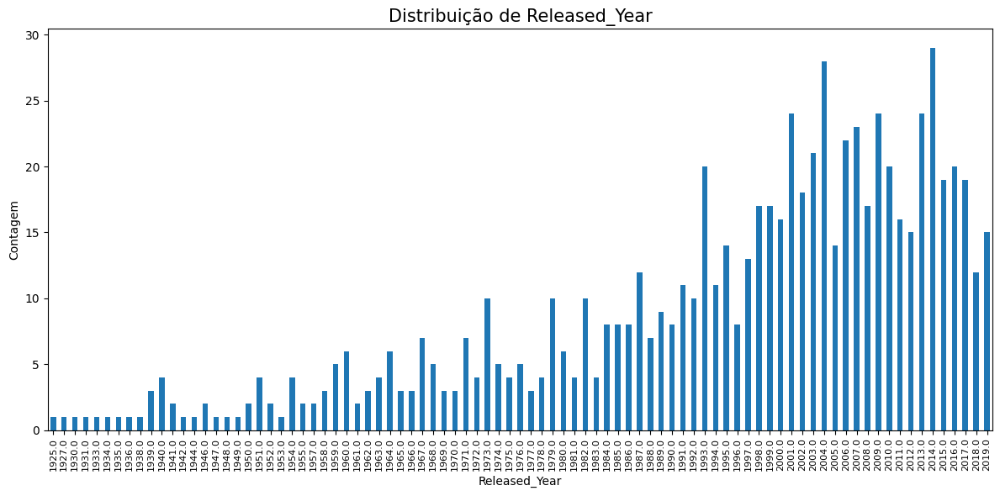

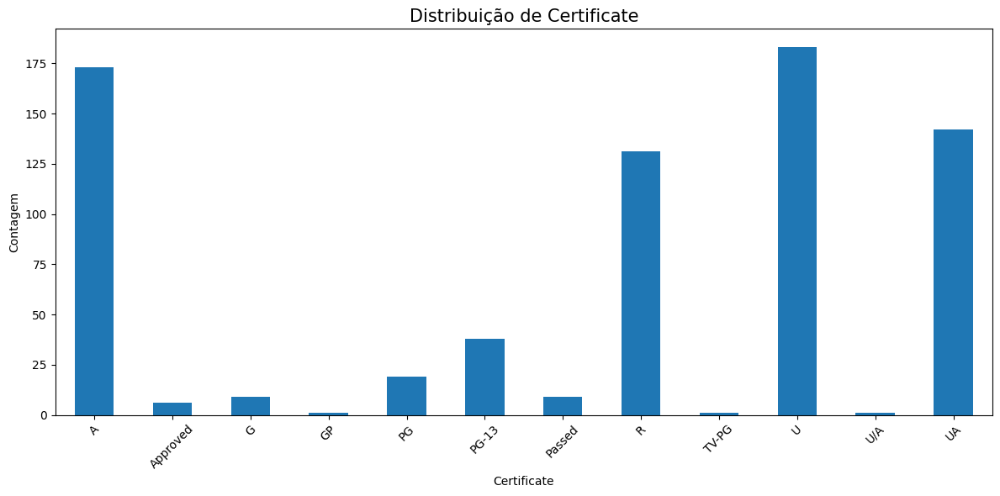

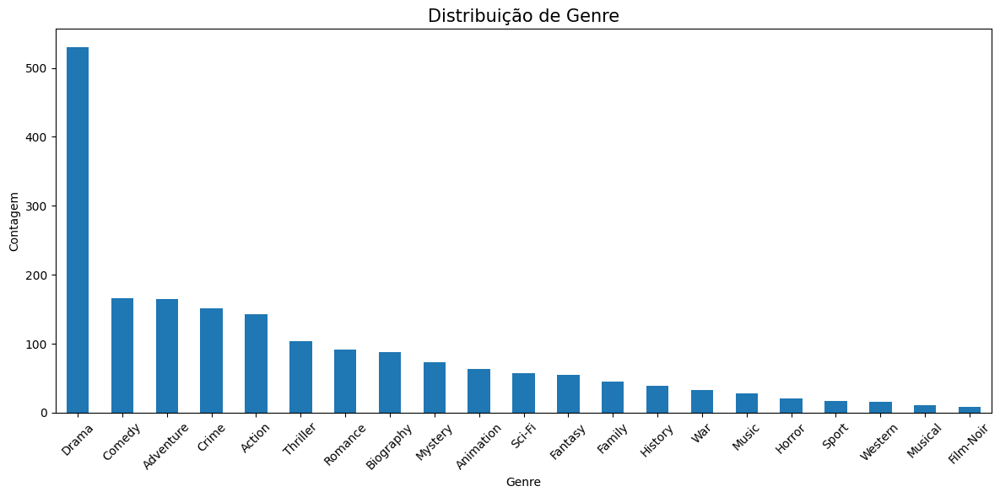

In [14]:
# Gráficos de barras para variáveis categóricas
categorical_cols = ['Released_Year', 'Certificate', 'Genre']

for col in categorical_cols:
    plt.figure(figsize=(12, 6))
    
    if col == 'Genre':
        # Contagem de gêneros únicos
        all_genres = df['Genre'].str.split(', ').explode().value_counts()
        all_genres.plot(kind='bar')
    else:
        df[col].value_counts().sort_index().plot(kind='bar')
    
    plt.title(f'Distribuição de {col}', fontsize=15)
    plt.xlabel(col)
    plt.ylabel('Contagem')
    
    if col == 'Released_Year':
        plt.xticks(rotation=90, fontsize=8)  # Rotacionar e diminuir a fonte dos anos
    else:
        plt.xticks(rotation=45)
    
    plt.tight_layout()  # Ajuste automático de layout para evitar sobreposição
    plt.show()


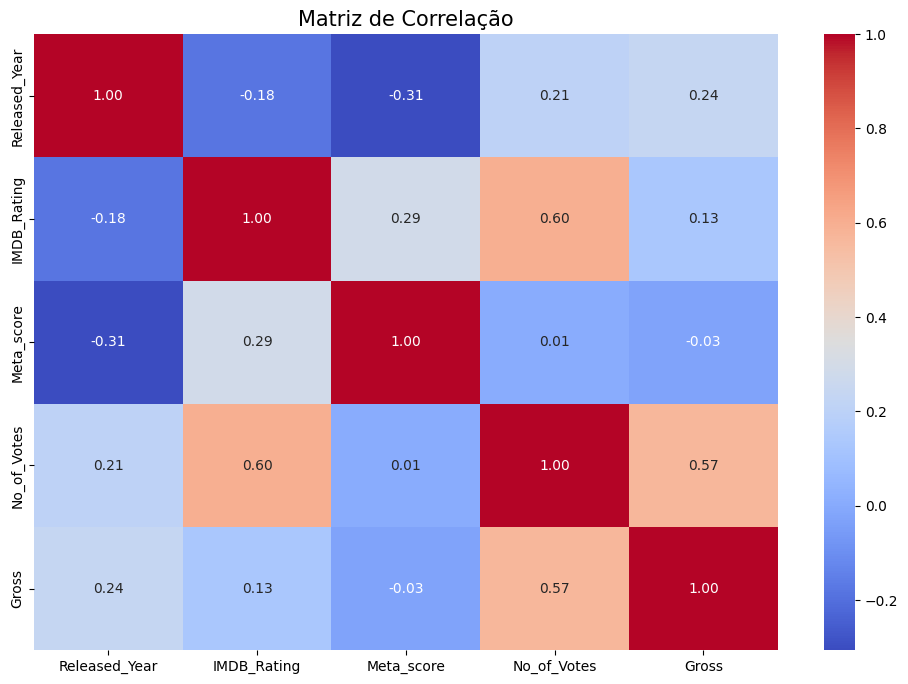

In [15]:
# Matriz de correlação
plt.figure(figsize=(12, 8))
correlation_matrix = df.corr(numeric_only=True)
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Matriz de Correlação', fontsize=15)
plt.show()


Primary_Genre
Family       2.195553e+08
Action       1.535550e+08
Animation    1.338575e+08
Adventure    8.919198e+07
Horror       7.358577e+07
Biography    6.471483e+07
Drama        4.314346e+07
Crime        3.895388e+07
Mystery      3.840551e+07
Comedy       3.768920e+07
Thriller     1.755074e+07
Western      1.455538e+07
Film-Noir    1.278626e+06
Name: Gross, dtype: float64


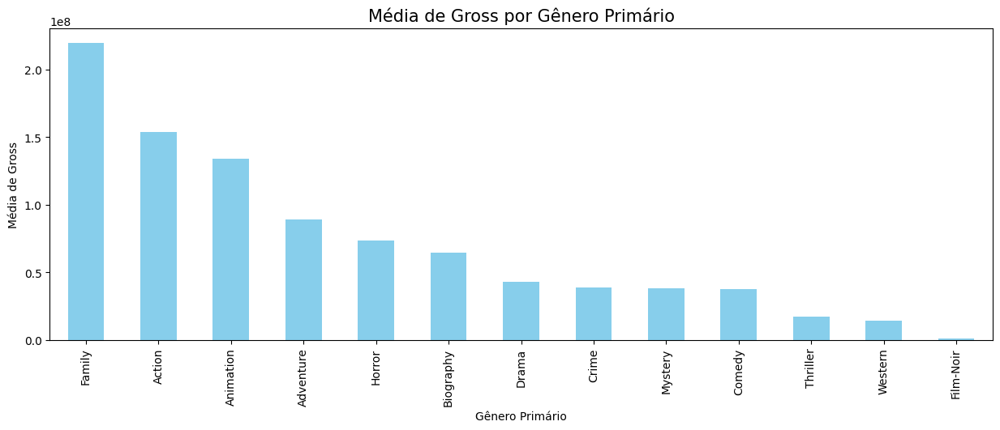

In [16]:
# Considerar apenas o primeiro gênero listado para evitar duplicidade
df['Primary_Genre'] = df['Genre'].str.split(', ').str[0]

# Calcular a média do faturamento por gênero primário
mean_gross_by_genre = df.groupby('Primary_Genre')['Gross'].mean().sort_values(ascending=False)

# Exibir os gêneros com maior lucro
print(mean_gross_by_genre)

# Plotar o gráfico de barras
plt.figure(figsize=(15, 5))
mean_gross_by_genre.plot(kind='bar', color='skyblue')
plt.title('Média de Gross por Gênero Primário', fontsize=15)
plt.xlabel('Gênero Primário')
plt.ylabel('Média de Gross')
plt.xticks(rotation=90)
plt.show()

### Hipóteses Baseadas na EDA

Com base na análise exploratória dos dados, podemos formular algumas hipóteses:

**Hipótese 1:** Filmes com mais votos no IMDb tendem a ter um maior faturamento (`Gross`).

- *Justificativa:* A correlação positiva entre o número de votos (`No_of_Votes`) e o faturamento sugere que filmes populares, que atraem mais votos, têm maior desempenho financeiro.

**Hipótese 2:** Filmes lançados em anos mais recentes tendem a ter um maior faturamento.

- *Justificativa:* A correlação positiva entre o ano de lançamento (`Released_Year`) e o faturamento indica que filmes lançados recentemente podem se beneficiar de melhores estratégias de marketing e distribuição, além de preços de ingressos mais altos.

**Hipótese 3:** A pontuação do IMDb (`IMDB_Rating`) está positivamente correlacionada com o faturamento, mas essa correlação não é muito forte.

- *Justificativa:* A correlação moderada entre a nota do IMDb e o faturamento sugere que, embora filmes bem avaliados possam atrair mais espectadores, outros fatores (como marketing e franquias estabelecidas) também desempenham papéis importantes.

**Hipótese 4:** Filmes do gênero "Family" têm uma média de faturamento maior em comparação com outros gêneros.

- *Justificativa:* A análise de distribuição do faturamento por gênero revelou que o gênero "Family" tende a ter maiores receitas, possivelmente devido ao seu apelo amplo e frequentes lançamentos de alto orçamento.

### 2- A) Qual filme você recomendaria para uma pessoa que você não conhece?

In [17]:
# Filme recomendado baseado em alta pontuação do IMDb e um grande número de votos
recommended_movie = df[df['IMDB_Rating'] == df['IMDB_Rating'].max()]
if not recommended_movie.empty:
    print("Filme recomendado:")
    print(f"Título: {recommended_movie['Series_Title'].iloc[0]}")
    print(f"Ano de lançamento: {recommended_movie['Released_Year'].iloc[0]}")
    print(f"Nota do IMDb: {recommended_movie['IMDB_Rating'].iloc[0]}")
    print(f"Número de votos: {recommended_movie['No_of_Votes'].iloc[0]}")
    print(f"Sinopse: {recommended_movie['Overview'].iloc[0]}")
else:
    print("Não foi possível encontrar um filme para recomendar.")


Filme recomendado:
Título: The Godfather
Ano de lançamento: 1972.0
Nota do IMDb: 9.2
Número de votos: 1620367
Sinopse: An organized crime dynasty's aging patriarch transfers control of his clandestine empire to his reluctant son.


### B) Quais são os principais fatores que estão relacionados com alta expectativa de faturamento de um filme? 

No_of_Votes      0.571207
Released_Year    0.235948
IMDB_Rating      0.132445
Meta_score      -0.030480
Name: Gross, dtype: float64


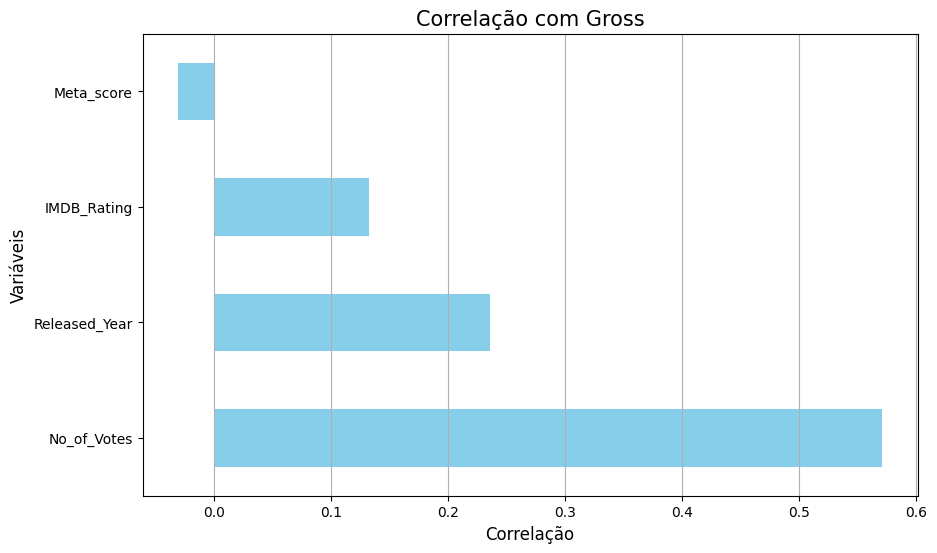

In [18]:
# Calculando a correlação com Gross incluindo 'Released_Year'
correlation_with_gross = correlation_matrix['Gross'].drop('Gross').sort_values(ascending=False)
print(correlation_with_gross)

# Plotando o gráfico de barras
plt.figure(figsize=(10, 6))
correlation_with_gross.plot(kind='barh', color='skyblue')
plt.title('Correlação com Gross', fontsize=15)
plt.xlabel('Correlação', fontsize=12)
plt.ylabel('Variáveis', fontsize=12)
plt.grid(axis='x')
plt.show()

### Principais Fatores Relacionados a Altas Expectativas de Faturamento de um Filme

A análise de correlação entre diversas variáveis e o faturamento (`Gross`) revelou insights importantes sobre os fatores que mais influenciam o desempenho financeiro de um filme. Os principais fatores identificados são:

1. **Número de Votos (`No_of_Votes`):** 
   - **Correlação:** 0.571207
   - **Descrição:** O número de votos recebidos no IMDb é o fator mais fortemente correlacionado com o faturamento. Isso sugere que filmes que atraem um grande número de espectadores para votar tendem a ter um desempenho financeiro melhor. Isso pode ser explicado pelo fato de que um maior envolvimento do público geralmente indica uma base de espectadores mais ampla e uma maior popularidade do filme.

2. **Ano de Lançamento (`Released_Year`):** 
   - **Correlação:** 0.235948
   - **Descrição:** O ano de lançamento do filme também apresenta uma correlação positiva com o faturamento, embora menos significativa do que o número de votos. Filmes lançados em anos mais recentes tendem a ter um maior faturamento, possivelmente devido a uma combinação de fatores como aumentos nos preços dos ingressos, melhor marketing, e maior acessibilidade através de diversas plataformas de distribuição.

3. **Nota do IMDb (`IMDB_Rating`):** 
   - **Correlação:** 0.132445
   - **Descrição:** A nota média no IMDb, que reflete a avaliação geral do público, também está positivamente correlacionada com o faturamento. Filmes com avaliações mais altas tendem a atrair mais espectadores, o que pode resultar em um maior desempenho financeiro. No entanto, a correlação moderada sugere que enquanto a qualidade percebida é importante, outros fatores também desempenham papéis cruciais no sucesso financeiro de um filme.

4. **Pontuação Agregada dos Críticos (`Meta_score`):** 
   - **Correlação:** -0.030480
   - **Descrição:** Curiosamente, a pontuação agregada dos críticos apresenta uma correlação ligeiramente negativa com o faturamento. Isso pode indicar que, em alguns casos, filmes com críticas mistas ou negativas ainda podem ter um bom desempenho financeiro, possivelmente devido a campanhas de marketing eficazes ou apelo popular que não se reflete necessariamente nas avaliações dos críticos.

### Conclusão

Em resumo, o número de votos no IMDb é o indicador mais forte de sucesso financeiro para um filme, seguido pelo ano de lançamento e pela nota média do IMDb. Embora a pontuação dos críticos seja um indicador de qualidade, sua correlação negativa sugere que não é um fator determinante para o sucesso financeiro. Esses insights podem ajudar na tomada de decisões estratégicas para futuros projetos cinematográficos, orientando esforços de marketing e distribuição para maximizar o faturamento potencial.


### C) Quais insights podem ser tirados com a coluna Overview? É possível inferir o gênero do filme a partir dessa coluna?

#### Word Clouds

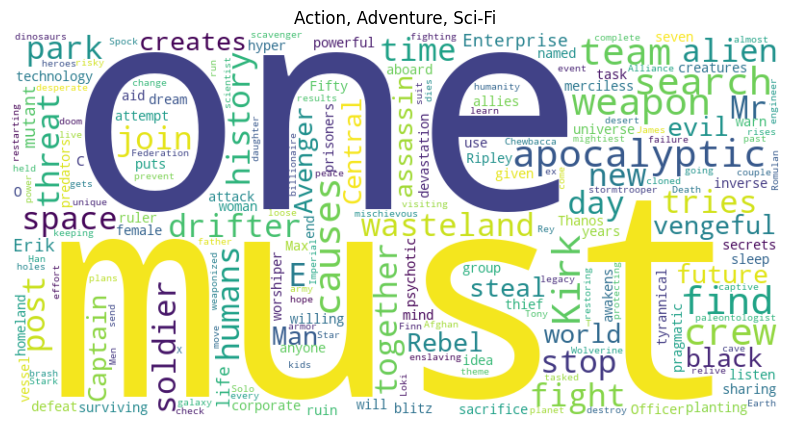

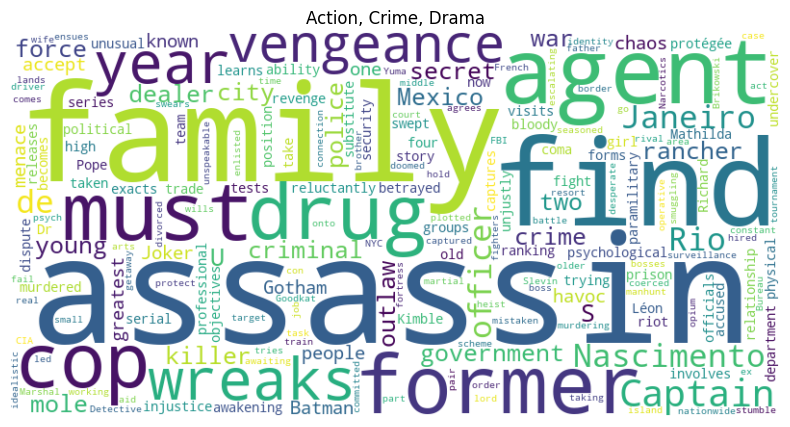

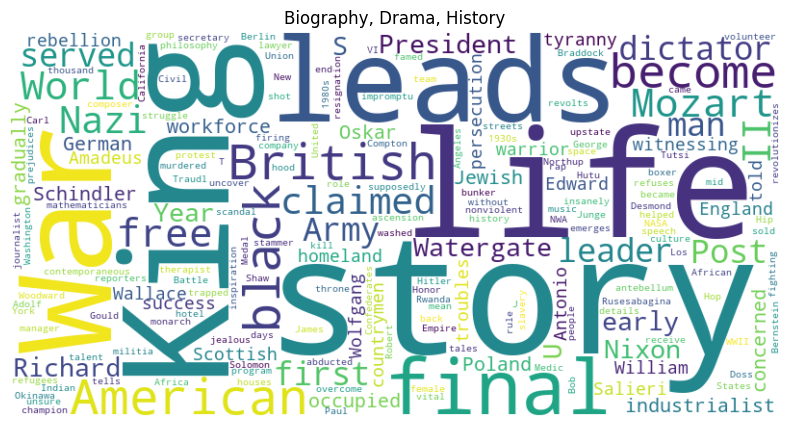

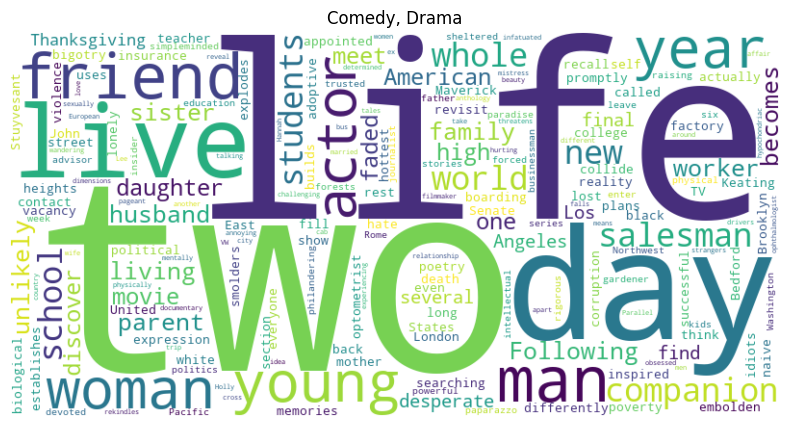

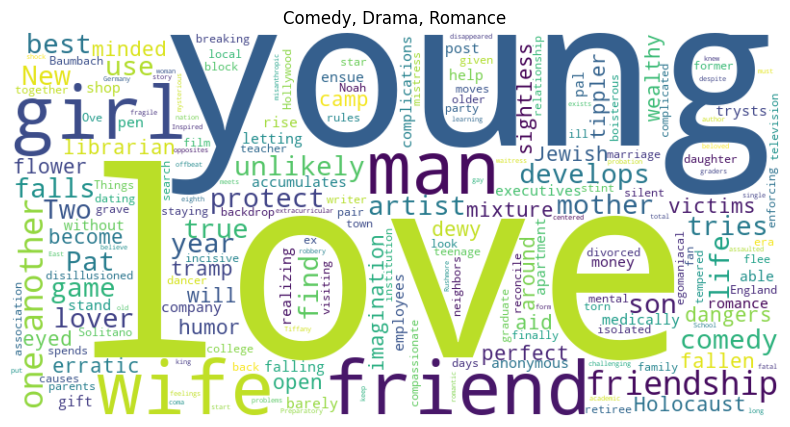

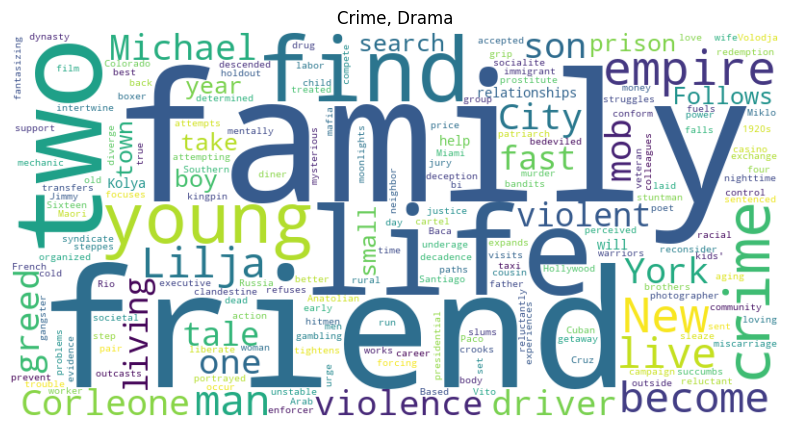

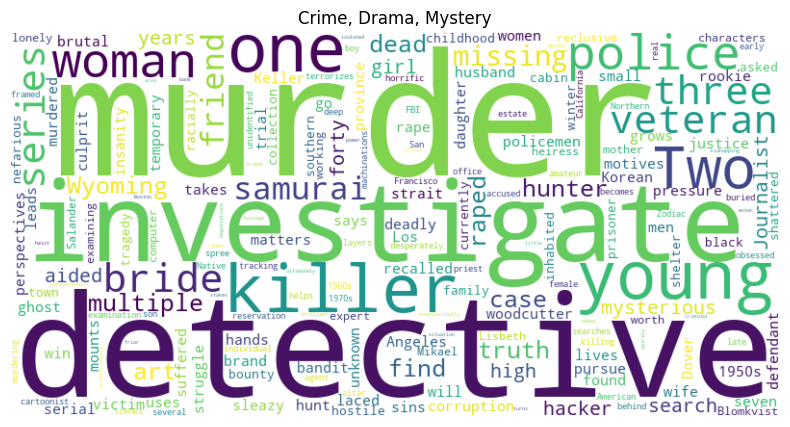

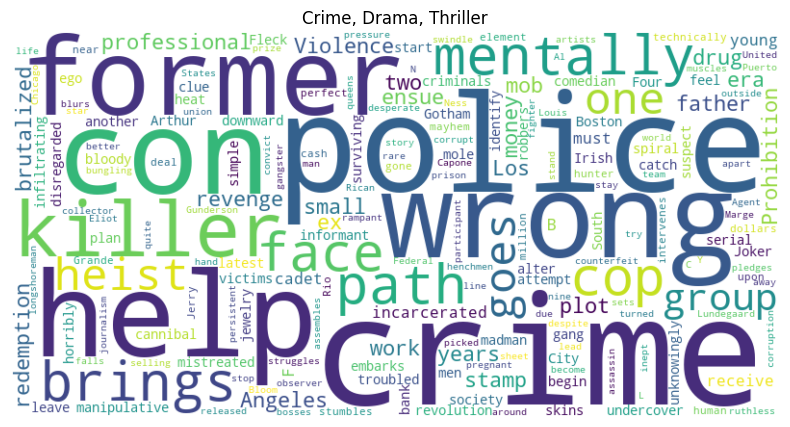

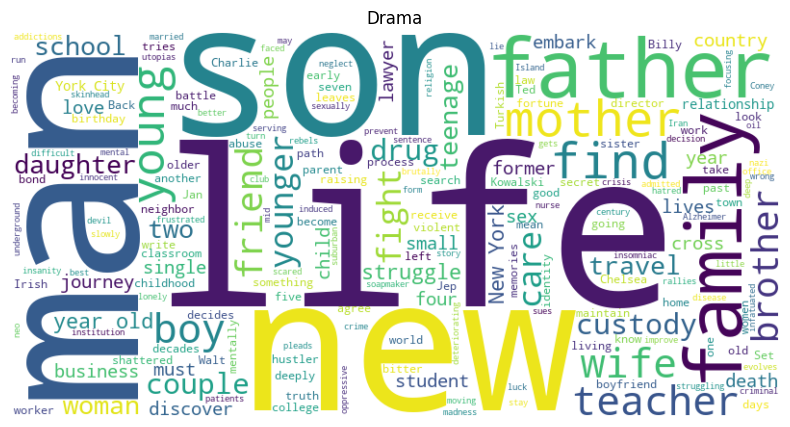

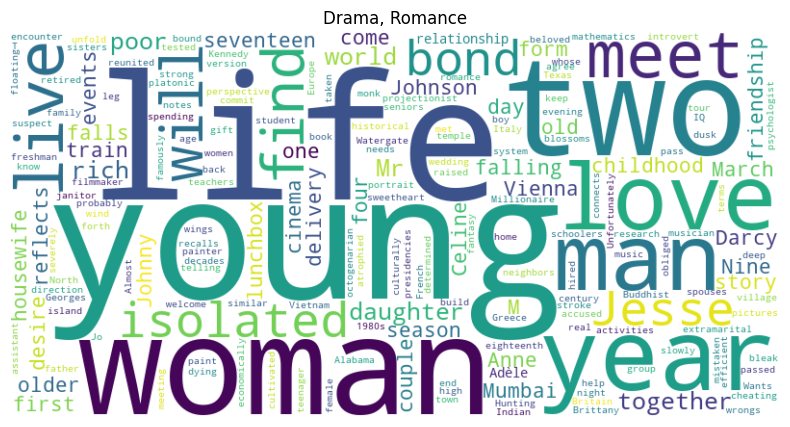

In [19]:
# Função para gerar Word Clouds para cada combinação de gênero na base de dados
def generate_word_clouds(genre_data):
    for genre, subset in genre_data.groupby('Genre'):
        # Combinar todas as descrições dos filmes em um único texto
        text = " ".join(description for description in subset['Overview'])
        # Gerar a Word Cloud
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
        # Plotar a Word Cloud
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(genre)
        plt.axis('off')
        plt.show()

# Preparar os dados, garantindo que não há valores nulos
df.dropna(subset=['Genre', 'Overview'], inplace=True)

# Vetorização e análise de palavras por gênero
vectorizer = TfidfVectorizer(stop_words='english')
df['tfidf'] = list(vectorizer.fit_transform(df['Overview']).toarray())

# Gerar e mostrar Word Clouds para os gêneros mais comuns
common_genres = df['Genre'].value_counts().nlargest(10).index  # Seleciona os 10 gêneros mais comuns
generate_word_clouds(df[df['Genre'].isin(common_genres)])


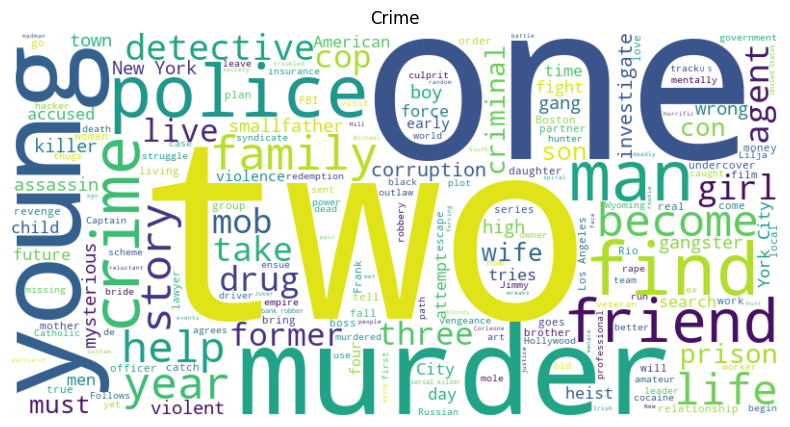

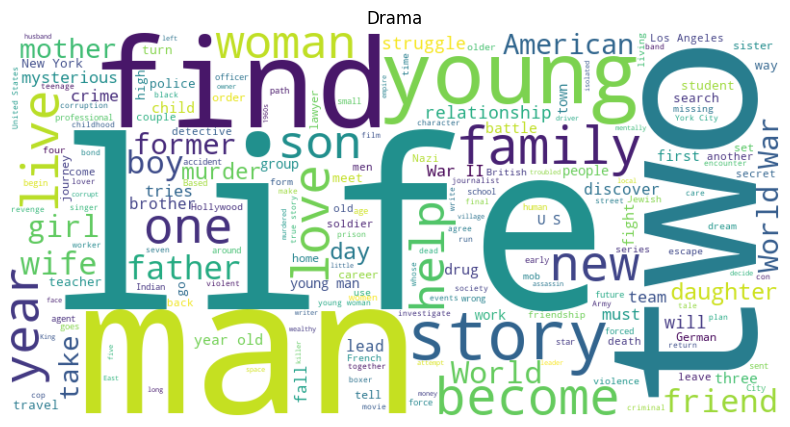

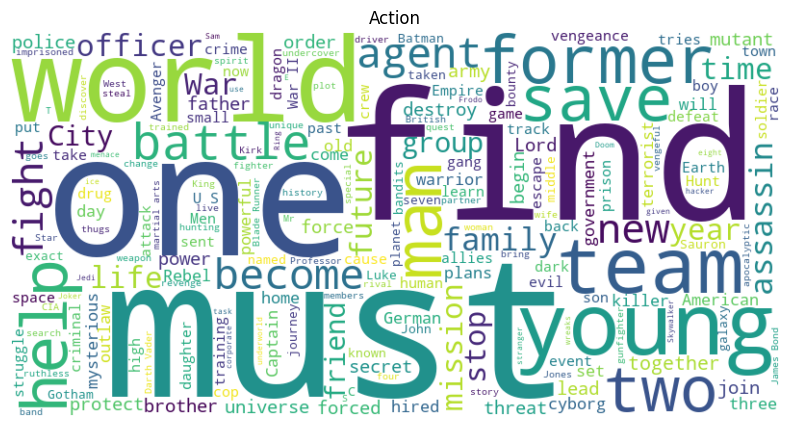

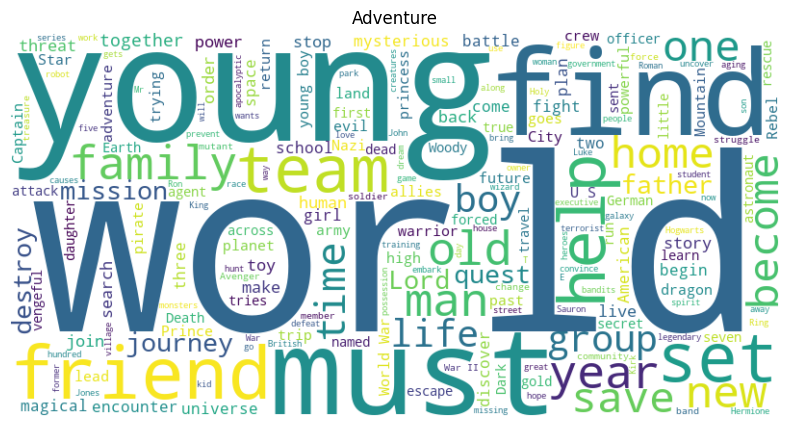

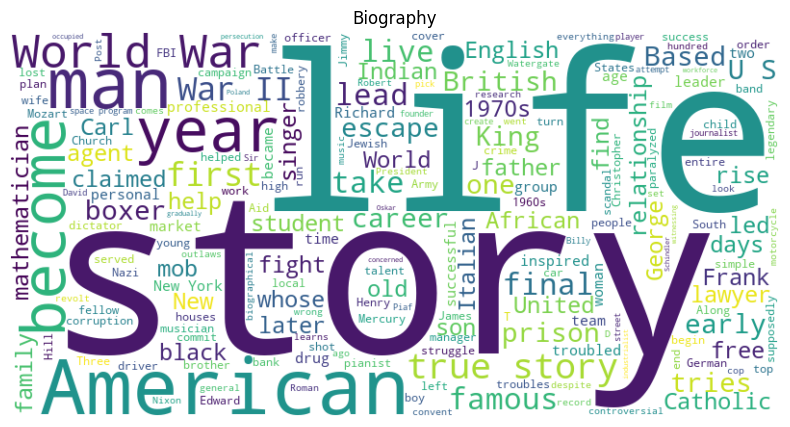

...

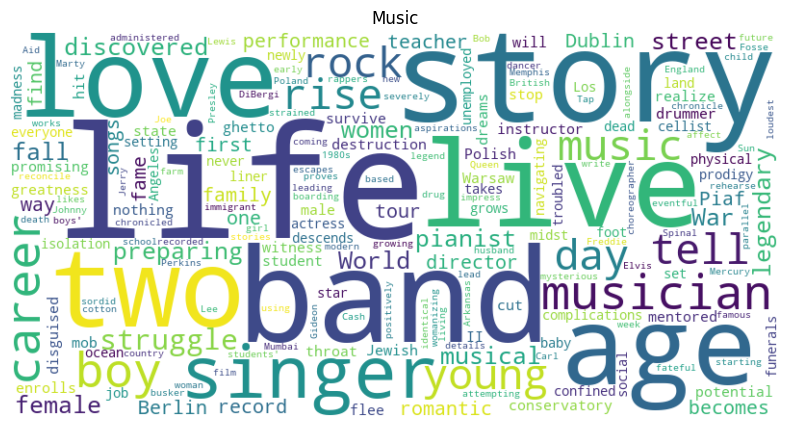

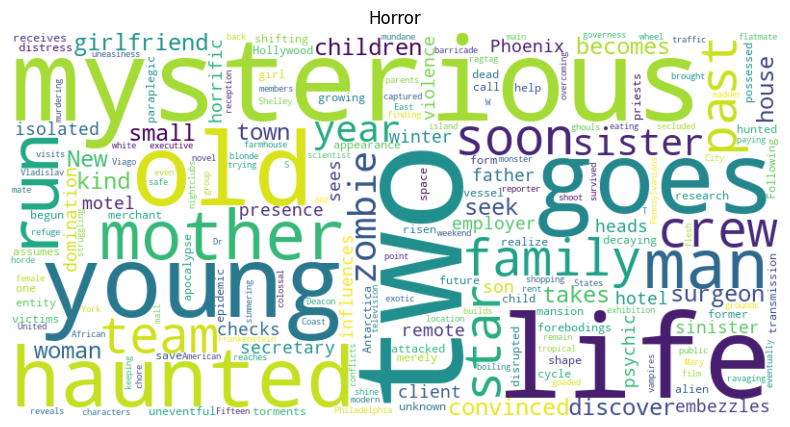

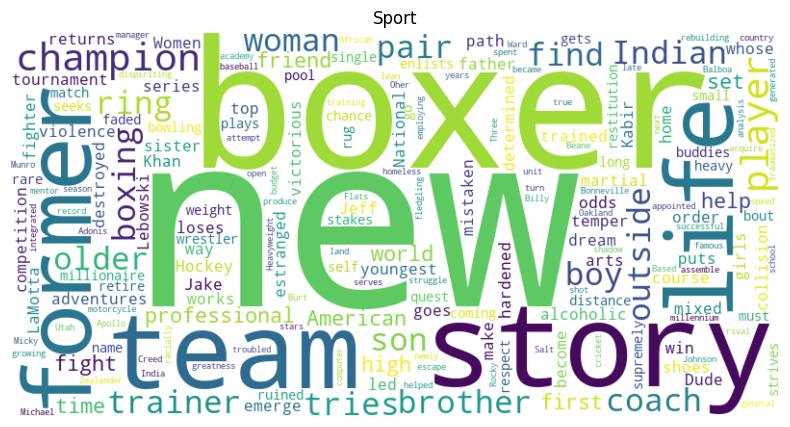

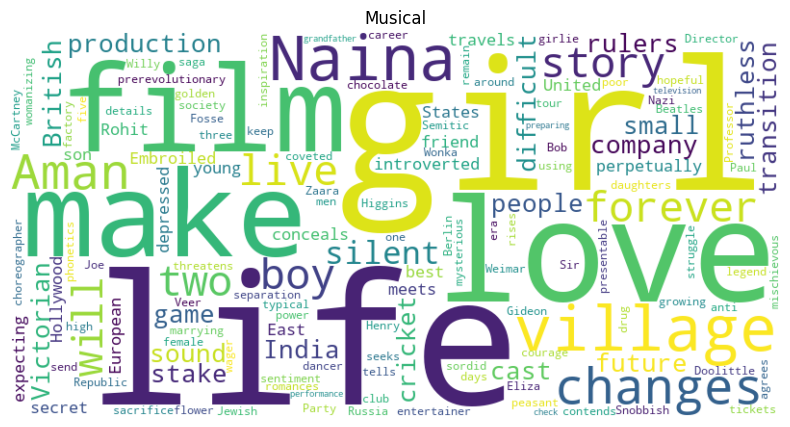

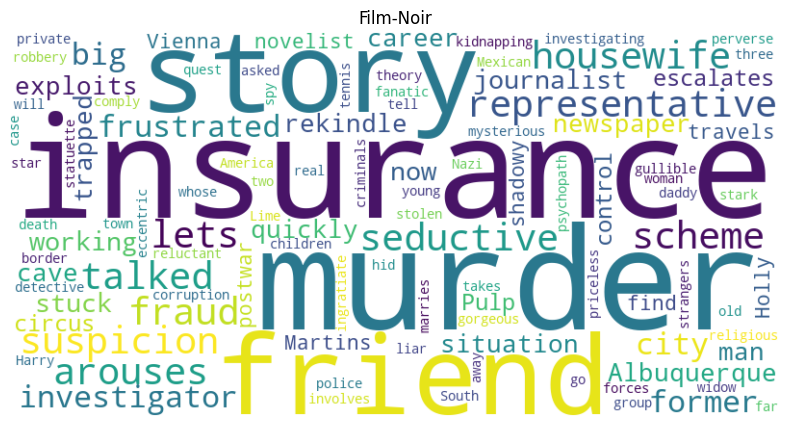

In [20]:
# Separar os gêneros combinados em gêneros únicos
def split_genres(df):
    # Cria um novo DataFrame expandindo os gêneros
    genres_expanded = df['Genre'].str.split(', ', expand=True).stack().reset_index(level=1, drop=True)
    genres_expanded.name = 'Single_Genre'
    return df.drop('Genre', axis=1).join(genres_expanded)

# Função para gerar Word Clouds para cada gênero
def generate_word_clouds(genre_data):
    for genre in genre_data['Single_Genre'].unique():
        text = " ".join(description for description in genre_data[genre_data['Single_Genre'] == genre]['Overview'])
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(genre)
        plt.axis('off')
        plt.show()

# Preparar os dados
df.dropna(subset=['Genre', 'Overview'], inplace=True)
df_expanded = split_genres(df)

# Gerar e mostrar Word Clouds para cada gênero único
generate_word_clouds(df_expanded)


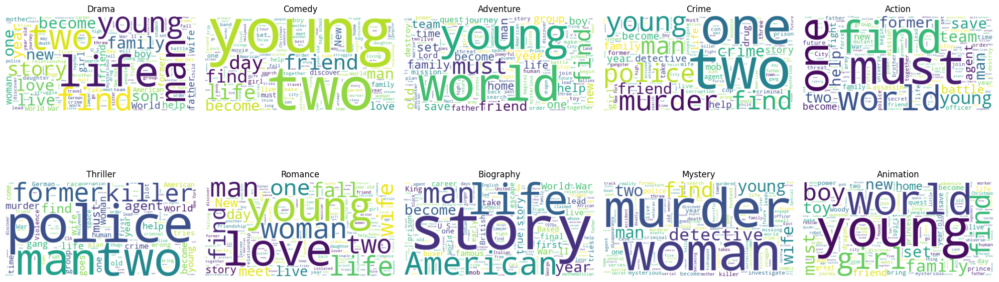

In [21]:
# Função para plotar várias Word Clouds em uma única figura
def plot_genre_wordclouds(df, n_genres=10):
    # Contar frequências dos gêneros para pegar os mais comuns
    genre_counts = df['Single_Genre'].value_counts()
    common_genres = genre_counts.head(n_genres).index

    # Configurar o gráfico
    fig, axes = plt.subplots(2, 5, figsize=(20, 8))  # Ajuste aqui conforme o número de gêneros desejados
    axes = axes.flatten()

    for i, genre in enumerate(common_genres):
        # Gerar texto para o gênero
        text = " ".join(df[df['Single_Genre'] == genre]['Overview'])
        wordcloud = WordCloud(width=400, height=200, background_color='white').generate(text)
        
        # Plotar Word Cloud no subplot
        axes[i].imshow(wordcloud, interpolation='bilinear')
        axes[i].set_title(genre, fontsize=12)
        axes[i].axis('off')

    # Ajustar o layout
    plt.tight_layout()
    plt.show()

# Exemplo de uso da função
# Suponha que df_expanded é o DataFrame já com gêneros separados
df_expanded = split_genres(df)  # Assegure-se de que a função split_genres foi definida anteriormente
plot_genre_wordclouds(df_expanded, n_genres=10)  # Ajuste n_genres conforme necessário


#### Avaliação dos Modelos para Previsão do Gênero do Filme a partir da Descrição 
Regressão Logística, Random Forest, Naive Bayes

In [26]:
## Previsão do Gênero do Filme a partir da Descrição

# Preprocessamento dos dados
df.dropna(subset=['Genre', 'Overview'], inplace=True)
df_expanded = df['Genre'].str.split(', ', expand=True).stack().reset_index(level=1, drop=True).rename('Single_Genre')
df_expanded = df.drop('Genre', axis=1).join(df_expanded)

# Vetorização das descrições dos filmes
vectorizer = TfidfVectorizer(stop_words='english')
X = vectorizer.fit_transform(df_expanded['Overview'])

# Transformar os gêneros em uma representação numérica
y = df_expanded['Single_Genre'].astype('category').cat.codes

# Dividir os dados em conjuntos de treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Treinar o modelo de Regressão Logística
log_model = LogisticRegression(max_iter=1000, random_state=42)
log_model.fit(X_train, y_train)
joblib.dump(log_model, 'log_genre_predictor.pkl')

# Treinar o modelo de Random Forest
rf_model_genre = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model_genre.fit(X_train, y_train)
joblib.dump(rf_model_genre, 'rf_genre_predictor.pkl')

# Treinar o modelo de Naive Bayes
nb_model = MultinomialNB()
nb_model.fit(X_train, y_train)
joblib.dump(nb_model, 'nb_genre_predictor.pkl')

# Avaliar os modelos
models = {
    "Regressão Logística": log_model,
    "Random Forest": rf_model_genre,
    "Naive Bayes": nb_model
}

for name, model in models.items():
    y_pred = model.predict(X_test)
    print(f"\nRelatório de Classificação - {name}:")
    print(classification_report(y_test, y_pred, zero_division=0))
    print(f"Acurácia do modelo - {name}: {accuracy_score(y_test, y_pred)}")



Relatório de Classificação - Regressão Logística:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        51
           1       0.00      0.00      0.00        38
           2       0.00      0.00      0.00        15
           3       0.00      0.00      0.00        21
           4       0.00      0.00      0.00        49
           5       0.00      0.00      0.00        51
           6       0.30      0.91      0.45       171
           7       0.00      0.00      0.00        15
           8       0.00      0.00      0.00        14
           9       0.00      0.00      0.00         4
          10       0.00      0.00      0.00        11
          11       0.00      0.00      0.00         9
          12       0.00      0.00      0.00        10
          13       0.00      0.00      0.00         2
          14       0.00      0.00      0.00        16
          15       0.00      0.00      0.00        31
          16       0.00      0

### 3- Previsão da Nota do IMDb: Variáveis, Transformações e Avaliação de Modelos


In [29]:

# Selecionar variáveis relevantes para a previsão
features = ['Released_Year', 'Runtime', 'Meta_score', 'No_of_Votes', 'Gross']

# Garantir que 'Runtime' seja tratado corretamente, verificando o tipo de dados
if not pd.api.types.is_numeric_dtype(df['Runtime']):
    df['Runtime'] = df['Runtime'].str.extract(r'(\d+)').astype(float)

# Verificar se 'Gross' é string e convertê-lo para numérico se necessário
if pd.api.types.is_string_dtype(df['Gross']):
    df['Gross'] = pd.to_numeric(df['Gross'].str.replace(',', ''), errors='coerce')

# Filtrar as colunas relevantes e lidar com valores ausentes
df_model = df[features + ['IMDB_Rating']].dropna()

# Dividir os dados em conjuntos de treino e teste
X = df_model[features]
y = df_model['IMDB_Rating']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Treinar o modelo de Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
joblib.dump(rf_model, 'rf_imdb_rating_predictor.pkl')

# Treinar o modelo de Regressão Linear
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
joblib.dump(lr_model, 'lr_imdb_rating_predictor.pkl')

# Treinar o modelo de Decision Tree Regressor
dt_model = DecisionTreeRegressor(random_state=42)
dt_model.fit(X_train, y_train)
joblib.dump(dt_model, 'dt_imdb_rating_predictor.pkl')

# Avaliar os modelos
models = {
    "Random Forest Regressor": rf_model,
    "Linear Regression": lr_model,
    "Decision Tree Regressor": dt_model
}

for name, model in models.items():
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f"\n{name} - Mean Squared Error: {mse}")
    print(f"{name} - R^2 Score: {r2}")


Random Forest Regressor - Mean Squared Error: 0.035324813333333094
Random Forest Regressor - R^2 Score: 0.578574602332983

Linear Regression - Mean Squared Error: 0.03904600601801111
Linear Regression - R^2 Score: 0.5341807341435582

Decision Tree Regressor - Mean Squared Error: 0.06702222222222227
Decision Tree Regressor - R^2 Score: 0.20042417815482505


## Conclusão

Os resultados das avaliações dos três modelos mostram diferentes níveis de desempenho. Vamos analisar os prós e contras de cada um e selecionar o melhor modelo com base nas métricas de desempenho.

### Explicação das Variáveis e Transformações Utilizadas

Para prever a nota do IMDb, escolhemos variáveis que são potencialmente preditivas da popularidade e qualidade de um filme. 
As variáveis utilizadas foram:
- **Released_Year**: Ano de lançamento do filme. Convertido para numérico.
- **Runtime**: Duração do filme em minutos. Extraído e convertido para numérico.
- **Meta_score**: Pontuação agregada de críticos. Utilizado diretamente.
- **No_of_Votes**: Número de votos recebidos no IMDb. Utilizado diretamente.
- **Gross**: Faturamento do filme. Convertido para numérico após remoção de vírgulas.

Essas variáveis foram escolhidas porque cada uma pode ter uma influência direta na percepção do público e dos críticos sobre o filme, refletindo-se na nota do IMDb.

### Tipo de Problema

Estamos resolvendo um problema de **regressão**, pois a variável alvo (nota do IMDb) é contínua.

### Modelos Utilizados

Testamos três modelos diferentes para prever a nota do IMDb:

1. **Random Forest Regressor**
   - **Prós**:
     - Captura interações não lineares entre as variáveis.
     - Robusto a outliers.
     - Requer pouco ajuste de parâmetros.
   - **Contras**:
     - Pode ser computacionalmente intensivo.
     - Pode superestimar a importância de variáveis altamente correlacionadas.

2. **Regressão Linear**
   - **Prós**:
     - Simplicidade e interpretabilidade.
     - Rápido para treinar e fazer previsões.
   - **Contras**:
     - Não captura relações não lineares.
     - Sensível a outliers.

3. **Decision Tree Regressor**
   - **Prós**:
     - Fácil de interpretar e visualizar.
     - Captura interações não lineares entre as variáveis.
   - **Contras**:
     - Pode ser propenso ao overfitting.
     - Não é robusto a pequenas variações nos dados.

### Medida de Performance

A medida de performance escolhida foi:
- **Mean Squared Error (MSE)**: Avalia a média dos quadrados dos erros, penalizando erros maiores.
- **R² Score**: Representa a proporção da variância total explicada pelo modelo. Um R² próximo de 1 indica um modelo que explica bem os dados.

### Seleção do Melhor Modelo

Com base nas métricas de desempenho obtidas:

- **Random Forest Regressor** apresentou um MSE de `0.035324813333333094` e um R² de `0.578574602332983`.
- **Regressão Linear** apresentou um MSE de `0.03904600601801111` e um R² de `0.5341807341435582`.
- **Decision Tree Regressor** apresentou um MSE de `0.06702222222222227` e um R² de `0.20042417815482505`.

O **Random Forest Regressor** apresentou os melhores resultados em termos de MSE e R², indicando que é o modelo mais adequado para prever a nota do IMDb nessa base de dados. Sua capacidade de capturar interações não lineares entre as variáveis e sua robustez a outliers tornam-no a melhor escolha para este problema.

Portanto, recomendamos o uso do **Random Forest Regressor** para a previsão das notas do IMDb.


### 4- Previsão da Nota do IMDb para um Filme Específico

In [28]:
# Detalhes do novo filme
new_movie = {
    'Released_Year': 1994,
    'Runtime': 142,
    'Meta_score': 80.0,
    'No_of_Votes': 2343110,
    'Gross': 28341469
}

new_movie_df = pd.DataFrame([new_movie])

# Carregar o modelo salvo e fazer a previsão
loaded_rf_model = joblib.load('rf_imdb_rating_predictor.pkl')
predicted_rating_rf = loaded_rf_model.predict(new_movie_df)
print(f'A nota prevista do IMDb para o filme (Random Forest) é: {predicted_rating_rf[0]}')

# Prever a nota do IMDb para um filme específico usando o modelo de Regressão Linear
loaded_lr_model = joblib.load('lr_imdb_rating_predictor.pkl')
predicted_rating_lr = loaded_lr_model.predict(new_movie_df)
print(f'A nota prevista do IMDb para o filme (Linear Regression) é: {predicted_rating_lr[0]}')

# Prever a nota do IMDb para um filme específico usando o modelo de Decision Tree Regressor
loaded_dt_model = joblib.load('dt_imdb_rating_predictor.pkl')
predicted_rating_dt = loaded_dt_model.predict(new_movie_df)
print(f'A nota prevista do IMDb para o filme (Decision Tree Regressor) é: {predicted_rating_dt[0]}')


A nota prevista do IMDb para o filme (Random Forest) é: 8.820999999999996
A nota prevista do IMDb para o filme (Linear Regression) é: 9.291896405877711
A nota prevista do IMDb para o filme (Decision Tree Regressor) é: 8.9
